# ***Set Parameters to define model etc***

In [1]:
#### Undersampling Possoin_Real:#####
Undersampling = "Possoin_Real" # Options: Regular or Possoin, w, Possoin_Real Regular_Real
Sampling_Mask = "Complementary_Masks" #Options: Single_Combination or One_Mask Complementary_Masks
AF = 5#  acceleration factor

#### Model Input and Output ####
GT_Data = "LowRank" # Options: FullRank LowRank for GROUNDTRUTH!
Low_Rank_Input = True ## apply low rank to the input as well if True
trancuate_t = 96 # set this parameter to control at which time step you stop using the signal

####M Model Parameters ####
batch_size=64

#### Parameters for which axes to choose as Model input and output
DOMAIN = "zfT"  # Input axes that goes into the network (as well as output), 
            # valid options: kzfT (this means k_z in kspace); zfT; ztT; xyz; xzT; xyf

In [2]:
import os
import sys

sys.path.append('../scripts')
sys.path.append('../models')

os.environ["CUDA_VISIBLE_DEVICES"]= '1' #, this way I would choose GPU 3 to do the work

from scipy.io import savemat
import torch
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import zoom # for compressing images / only for testing purposes to speed up NN training
from torch.utils.data import DataLoader, Subset
import torch.optim as optim
import torch.nn as nn
from data_preparation import *
from data_undersampling import *
from output_statistics import *
from data_augmentation import *

from interlacer_layer_modified import *
from Residual_Interlacer_modified import *
from skimage.metrics import structural_similarity as ssim 

#### Model import correct model
from Unet import * #from Naive_CNN_3D_Residual_No_Batch_Norm import *

grouped_time_steps = 1 # Set how many subsequent time steps you want to give to the network at once. Values allowed: 1, 2, 4, 8 (because it has to divide 8)

In [3]:
ground_truth_path = "../data/Ground_Truth/Multi_Channel/data.npy"

#### Define Input Data path
undersampled_data_path = "../data/Undersampled_Data_New/data.npy"

#### Definie Model path
if GT_Data == "FullRank":
    saved_model_path = f"../saved_models/UNet_3D_new_data/"+DOMAIN+"/Full2Full/"+Undersampling+f'/AF_{AF}/'+f'Truncate_t_{trancuate_t}/'+Sampling_Mask+f'/best_model.pth'
elif GT_Data == "LowRank":
    saved_model_path = f"../saved_models/UNet_3D_new_data/"+DOMAIN+"/Low2Low/"+Undersampling+f'/AF_{AF}/'+f'Truncate_t_{trancuate_t}/'+Sampling_Mask+f'/best_model.pth'
    
#if not os.path.exists(saved_model_path):
#     raise FileNotFoundError(f"Error: The path '{saved_model_path}' does not exist.")
    
#### load data!
Ground_Truth = np.load(ground_truth_path)
Undersampled_Data = np.load(undersampled_data_path)
MASKS = np.load("../data/masks.npy")

#if Low_Rank_Input:
#    for i in range(0,6):
#        Undersampled_Data[...,i] = low_rank(Undersampled_Data[...,i], 8)
#        if GT_Data == "LowRank":
#            Ground_Truth[...,i] = low_rank(Ground_Truth[...,i], 8)
    
###normalize entire 5D volumes volumes 

Ground_Truth = Ground_Truth[...,:40,:96,:]
Undersampled_Data = Undersampled_Data[...,:40,:96,:]

Ground_Truth = Ground_Truth/np.max(np.abs(Ground_Truth))
Undersampled_Data = Undersampled_Data/np.max(np.abs(Undersampled_Data))

padding_last_axis = 8 - Ground_Truth.shape[-1]  # 8 - 3 = 5

# Build the pad_width list. For every axis except the last, pad with (0,0).
pad_width = [(0, 0)] * (Ground_Truth.ndim - 1) + [(0, padding_last_axis)]

Ground_Truth = np.pad(Ground_Truth, pad_width, mode='constant', constant_values=0)
Undersampled_Data = np.pad(Undersampled_Data, pad_width, mode='constant', constant_values=0)

# Undersampled_Data[...,-1] = torch.load('norm_mrsi_recons.pt').numpy()
####
mask_expanded = np.ones((32,32,40,96,8))  # Now shape is (22,22,21,1,1,6)
# Use broadcasting to "repeat" the mask along these new axes:
#mask_extended = np.broadcast_to(mask_expanded, (22, 22, 21, 96, 8, 6))
mask_extended = mask_expanded + 1J*mask_expanded

#### additionally make LowRank 8 transformation on input of network, this improves the error significantly!

    
#### trancuate spectral dimension with trancuate_t


### Pad spatial dimensions from 22,22,21 to 24,24,24 which is necessary for U-Net (needs to be divisible by 8 due to downsampling)
#pad_width = ((1, 1), (1, 1), (1, 2),(0, 0), (0, 0), (0, 0))    

#Ground_Truth = np.pad(Ground_Truth, pad_width, mode='constant', constant_values=0)
#Undersampled_Data = np.pad(Undersampled_Data, pad_width, mode='constant', constant_values=0)
#mask_extended = np.pad(mask_extended, pad_width, mode='constant', constant_values=0)

reshape_vector, inverse_reshape = get_reshape_vectors(DOMAIN)

reshape_vector, inverse_reshape = reshape_vector[:5], inverse_reshape[:5]

Undersampled_Data, Ground_Truth = np.fft.fftshift(np.fft.fft(Undersampled_Data, axis=-2), axes=-2), np.fft.fftshift(np.fft.fft(Ground_Truth, axis=-2), axes=-2)
    
#### Reshaping !
Undersampled_Data, Ground_Truth, mask_extended = Undersampled_Data.transpose(reshape_vector) , Ground_Truth.transpose(reshape_vector), mask_extended.transpose(reshape_vector)  
original_shape = Ground_Truth.copy().shape

In [6]:
#### Train_Test_Split ####
ground_truth = Ground_Truth

#### Assign undersampled network input ####
NN_input = Undersampled_Data

Mask =  mask_extended

# #### Collapse ununsed dimensions ####
ground_truth = ground_truth.reshape(Ground_Truth.shape[0], Ground_Truth.shape[1], Ground_Truth.shape[2], -1)
NN_input = NN_input.reshape(Ground_Truth.shape[0], Ground_Truth.shape[1], Ground_Truth.shape[2], -1)
Mask = Mask.reshape(Ground_Truth.shape[0], Ground_Truth.shape[1], Ground_Truth.shape[2], -1)


#### reshape for pytorch ####
data, labels, Mask  = reshape_for_pytorch(NN_input, grouped_time_steps), reshape_for_pytorch(ground_truth, grouped_time_steps), reshape_for_pytorch(Mask, grouped_time_steps)

In [7]:
data.shape

(1024, 2, 40, 96, 8)

In [8]:
# Create TensorDataset instances
dataset = TensorDataset(data, labels, Mask)

# Create DataLoaders
data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

  # Number of convolutional layers
model = UNet3D().to(device)

# 2. Load the model's state_dict (weights) from the saved file

checkpoint = torch.load(saved_model_path, map_location=device)
# Extract the model state_dict
model.load_state_dict(checkpoint["model_state_dict"])

<All keys matched successfully>

In [9]:
# #### Define Input Data path
GM_mask = np.load("../data/fn_vb_DMI_CRT_P08/GM_mask.npy")
GM_mask = GM_mask[:,:,:,np.newaxis,np.newaxis]

#### load data back to its original format
#### load data!
Ground_Truth = np.load(ground_truth_path)
Undersampled_Data = np.load(undersampled_data_path)
MASKS = np.load("../data/masks.npy")

Ground_Truth = Ground_Truth[...,:40,:96,:]
Undersampled_Data = Undersampled_Data[...,:40,:96,:]
###normalize entire 5D volumes volumes 
Ground_Truth = Ground_Truth/np.max(np.abs(Ground_Truth))
Undersampled_Data = Undersampled_Data/np.max(np.abs(Undersampled_Data))

padding_last_axis = 8 - Ground_Truth.shape[-1]  # 8 - 3 = 5

# Build the pad_width list. For every axis except the last, pad with (0,0).
pad_width = [(0, 0)] * (Ground_Truth.ndim - 1) + [(0, padding_last_axis)]

Ground_Truth = np.pad(Ground_Truth, pad_width, mode='constant', constant_values=0)
Undersampled_Data = np.pad(Undersampled_Data, pad_width, mode='constant', constant_values=0)

In [11]:
model.eval()  # Set the model to evaluation mode

outputs_list = []

# Disable gradient computation for efficiency
with torch.no_grad():
    for data, _, _ in data_loader:
        inputs_img = data.to(device)  # Move input tensor to the appropriate device
        outputs = model((inputs_img))  # Pass the inputs as a tuple to the model

        # If model returns a tuple, extract the first element
        if isinstance(outputs, tuple):
            outputs = outputs[0]

        outputs_list.append(outputs.cpu().numpy())  # Convert to numpy and move to CPU

# Concatenate all outputs
outputs_array = np.concatenate(outputs_list, axis=0)
outputs_array = inverse_reshape_for_pytorch(outputs_array, grouped_time_steps)
outputs_array = outputs_array.reshape(original_shape)
outputs_array = outputs_array.transpose(inverse_reshape)
outputs_array =np.fft.ifft(np.fft.ifftshift(outputs_array, axes=-2), axis=-2) 


In [12]:
import numpy as np
import matplotlib.pyplot as plt

# Given indices
z, t, T = 25, 0, 0

# Extract the 2D slices using np.abs for absolute values
Slice_1 = np.abs(Ground_Truth)[:, :, z, t, T]
Slice_2 = np.abs(outputs_array)[:, :, z, t, T]
Slice_3 = np.abs(Undersampled_Data)[:, :, z, t, T]

# Create a figure with 1 row and 3 columns of subplots
#fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Display Ground Truth (left)
#axes[0].imshow(Slice_1)
#axes[0].set_title('Ground Truth')
#axes[0].axis('off')  # Hide axis ticks

# Display Model Output (middle)
#axes[1].imshow(Slice_2)
#axes[1].set_title('Model Output')
#axes[1].axis('off')

# Display Model Input (right)
#axes[2].imshow(Slice_3)
#axes[2].set_title('Model Input')
#axes[2].axis('off')

# Adjust layout so titles and images do not overlap
#plt.tight_layout()

# Show the plot
#plt.show()


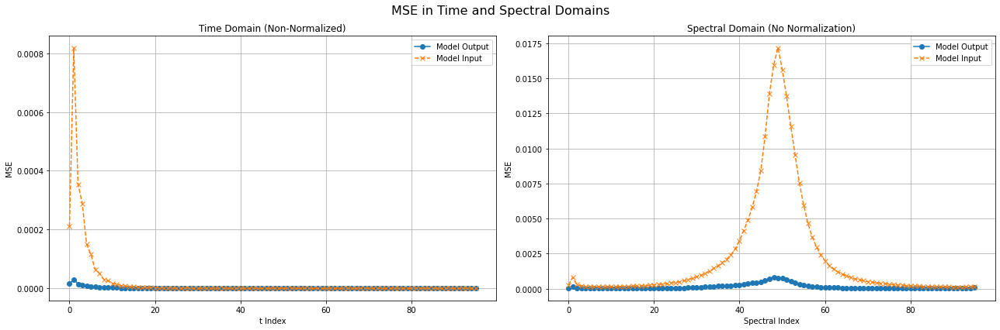

==== Model Output vs Ground Truth ====
Total MSE in image domain: 7.03430122157154e-07
Normalized Total MSE in image domain: 7.03430122157154e-07
Total MSE in spectral domain: 6.752929172708671e-05

==== Model Input vs Ground Truth ====
Total MSE in image domain: 1.146836714239237e-05
Normalized Total MSE in image domain: 1.1468367142392373e-05
Total MSE in spectral domain: 0.001100963245669668


../scripts/output_statistics.py:697: RuntimeWarning: divide by zero encountered in log10
  psnr_per_spatial_volume = 10 * np.log10(max_signal_per_spatial_volume / mse)
../scripts/output_statistics.py:697: RuntimeWarning: invalid value encountered in true_divide
  psnr_per_spatial_volume = 10 * np.log10(max_signal_per_spatial_volume / mse)


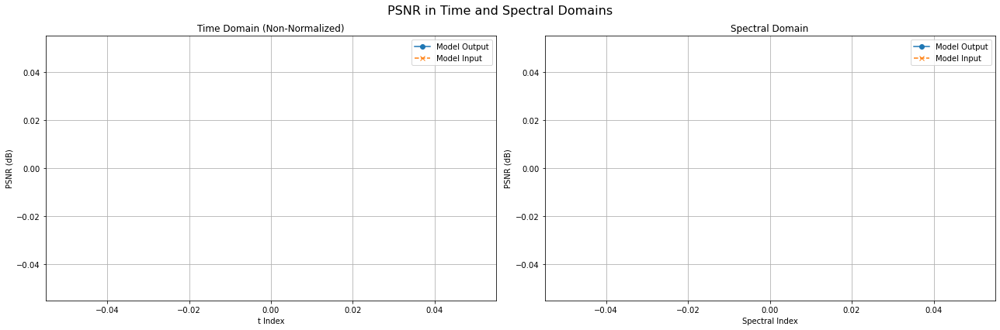

==== Model Output vs. Ground Truth ====
Average PSNR in image domain:    -inf
Average PSNR in frequency domain: -inf

==== Model Input vs. Ground Truth ====
Average PSNR in image domain:    nan
Average PSNR in frequency domain: nan


/opt/conda/lib/python3.7/site-packages/skimage/metrics/_structural_similarity.py:208: RuntimeWarning: invalid value encountered in true_divide
  S = (A1 * A2) / D


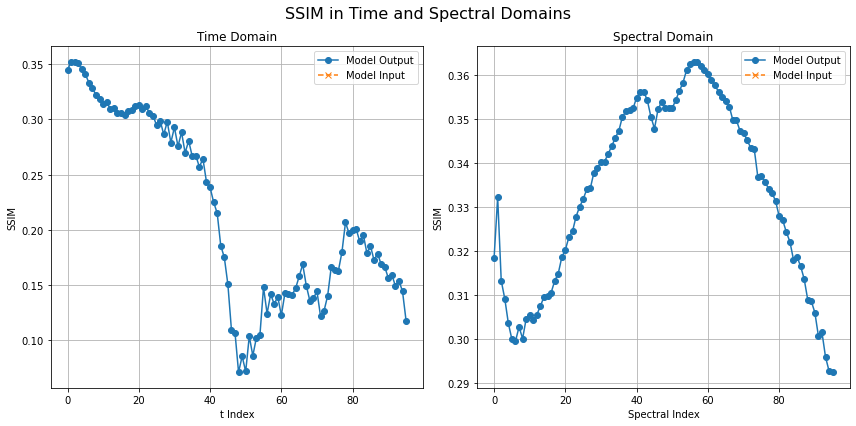

==== Model Output vs. Ground Truth ====
Average SSIM in image domain:    0.21530116622363074
Average SSIM in frequency domain: 0.3332282886203419

==== Model Input vs. Ground Truth ====
Average SSIM in image domain:    nan
Average SSIM in frequency domain: nan


In [13]:
norm_values = np.ones((data.shape[0]))

Model_Outputs_Test_Set = outputs_array

Test_Set = 5

Model_Outputs_Test_Set = Model_Outputs_Test_Set
ground_truth = Ground_Truth
norm_values_test = np.ones((trancuate_t,8))
### to be fair, I compute a LR approximation, as a trivial baseline comparison + apply the mask
model_input = Undersampled_Data
model_input = model_input[:,:,:,:trancuate_t,:]

plot_general_statistics(Model_Outputs_Test_Set, model_input, ground_truth, trancuate_t, norm_values_test, label = "Model Output", label2 = "Model Input")
plot_general_statistics_PSNR(Model_Outputs_Test_Set, model_input, ground_truth, trancuate_t, norm_values_test, label = "Model Output", label2 = "Model Input")
plot_general_statistics_SSIM(Model_Outputs_Test_Set, model_input, ground_truth, trancuate_t, norm_values_test, label = "Model Output", label2 = "Model Input")

In [14]:
#tf = 50 #50 = Water, 61 Glucose, 24 Glx
#T = 2

#comparison_Plot_3D_vs_Ifft(Model_Outputs_Test_Set, ground_truth, model_input, tf, T, domain="spectral", label = "Model Output", label2 = "Model Input (DFT+LR8)", label3="Ground Truth", fixed_scale = False)

In [15]:
#tf = 61 #50 = Water, 61 Glucose, 24 Glx
#T = 1

#comparison_Plot_3D_vs_Ifft(Model_Outputs_Test_Set, ground_truth, model_input, tf, T, domain="spectral", label = "Model Output", label2 = "Model Input (DFT+LR8)", label3="Ground Truth", fixed_scale = False)

In [16]:
#tf = 78 #50 = Water, 61 Glucose, 24 Glx
#T = 1

#comparison_Plot_3D_vs_Ifft(Model_Outputs_Test_Set, ground_truth, model_input, tf, T, domain="spectral", label = "Model Output", label2 = "Model Input (DFT+LR8)", label3="Ground Truth", fixed_scale = False)

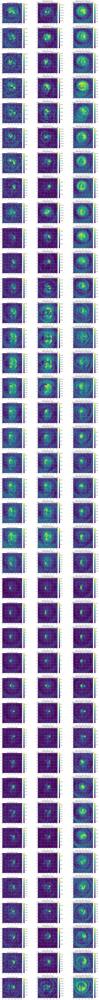

In [17]:
t = 1 #50 = Water, 60 Glucose, 24 Glx
T = 2

### NOTE: The labels are off, due to swapping I actually show z-y images along the x axis
ground_truth_swapped = np.swapaxes(ground_truth, 0, 2)
Model_Outputs_Test_Set_swapped = np.swapaxes(Model_Outputs_Test_Set, 0, 2)
model_input_swapped = np.swapaxes(model_input, 0, 2)

comparison_Plot_3D_vs_Ifft(Model_Outputs_Test_Set, ground_truth, model_input, t, T, domain="time", label = "Model Output", label2 = "Model Input (DFT+LR8)", label3="Ground Truth", fixed_scale = False)

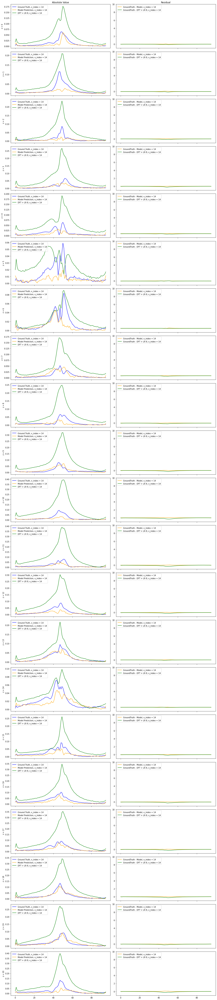

===================Next x index===========================


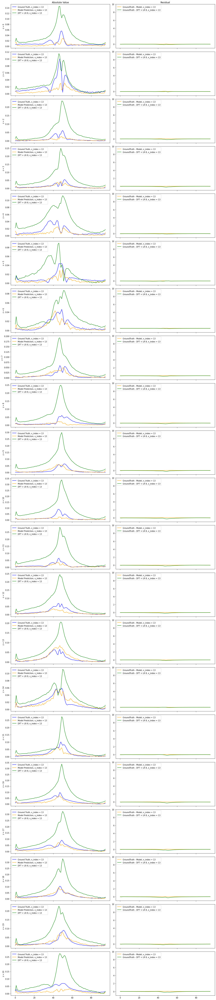

===================Next x index===========================


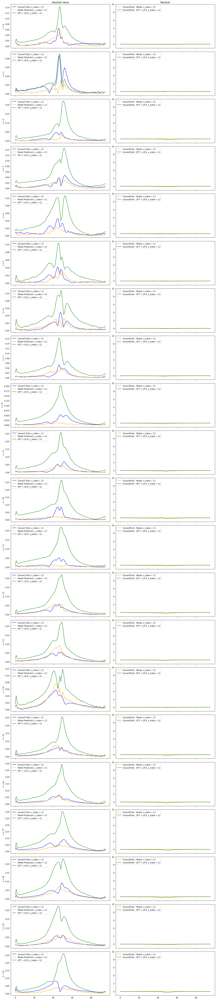

===================Next x index===========================


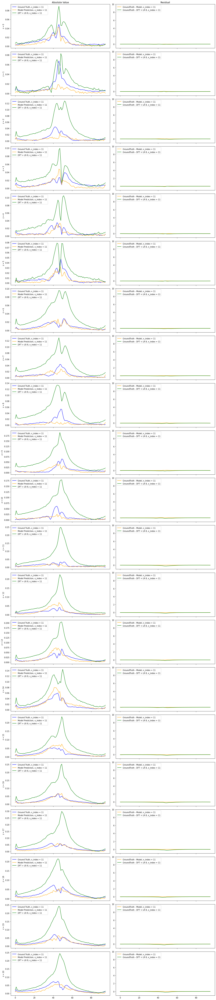

===================Next x index===========================


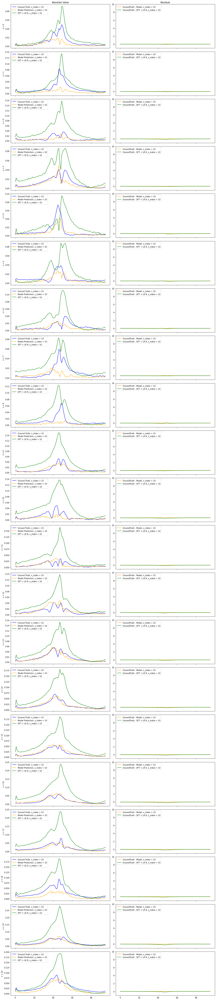

===================Next x index===========================


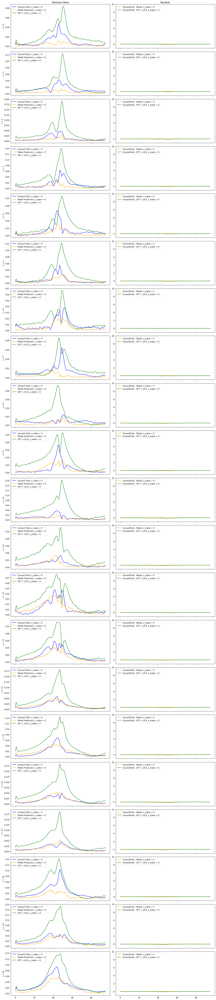

===================Next x index===========================


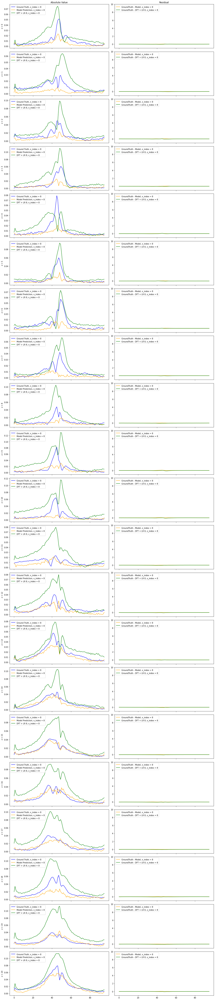

===================Next x index===========================


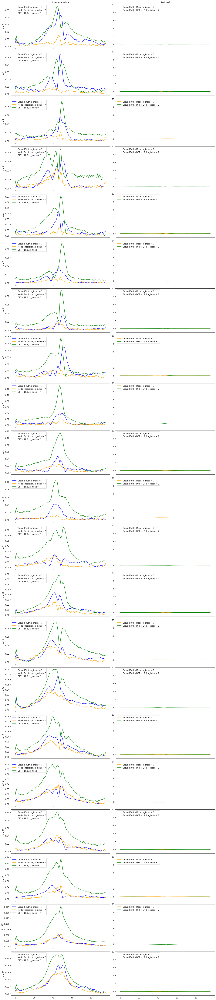

===================Next x index===========================


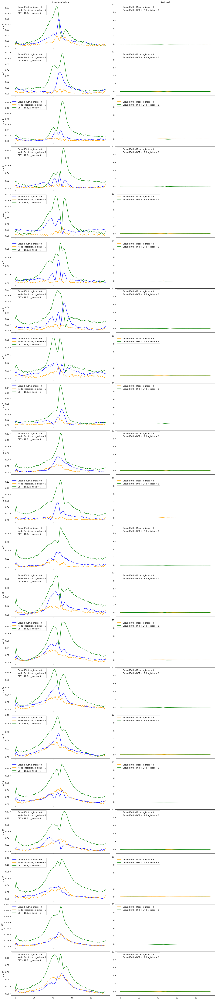

===================Next x index===========================


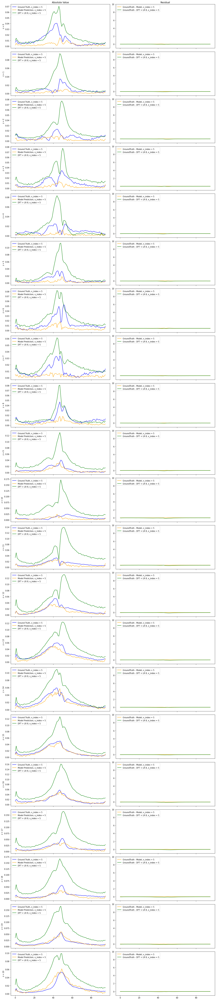

===================Next x index===========================


In [18]:
ground_truth_spectral = np.fft.fftshift(np.fft.fft(ground_truth, axis=-2), axes=-2)
model_pred_spectral = np.fft.fftshift(np.fft.fft(Model_Outputs_Test_Set, axis=-2), axes=-2)
IFF_LR_8 = np.fft.fftshift(np.fft.fft(model_input, axis=-2), axes=-2)

IFF_LR_8 = np.fft.fftshift(np.fft.fft(model_input, axis=-2), axes=-2)
# Fixed indices for x, y, and T:
# ----------------------------------------------------------------------
# Fixed indices for x, y, and T
# 10
for x_fixed in range(14, 4, -1):
    #x_fixed = 10
    y_fixed = 10
    T_fixed = 1

    num_z = 21  # Number of z slices

    # ----------------------------------------------------------------------
    # Create a figure with 2 columns:
    #   Column 1 -> Absolute value plots
    #   Column 2 -> Residuals (GT - [Others])
    # ----------------------------------------------------------------------
    fig, axes = plt.subplots(nrows=num_z, ncols=2, figsize=(16, num_z * 3.5), sharex=True)

    # If there's only one row, ensure axes is 2D
    if num_z == 1:
        axes = np.array([axes])

    for z in range(num_z):
        # Extract the spectra at [x_fixed, y_fixed, z, :, T_fixed]
        gt_spec  = ground_truth_spectral[x_fixed, y_fixed, z, :, T_fixed]
        mp_spec  = model_pred_spectral[x_fixed, y_fixed, z, :, T_fixed]
        iff_spec = IFF_LR_8[x_fixed, y_fixed, z, :, T_fixed]

        # ------------------------------------------------------------------
        # Column 1: Plot absolute spectra
        # ------------------------------------------------------------------
        ax_abs = axes[z, 0]
        ax_abs.plot(np.abs(gt_spec),  label=f'Ground Truth, x_index = {x_fixed}',    color='blue')
        ax_abs.plot(np.abs(mp_spec),  label=f'Model Prediction, x_index = {x_fixed}',color='orange')
        ax_abs.plot(np.abs(iff_spec), label=f'DFT + LR 8, x_index = {x_fixed}',     color='green')
        #ax_abs.set_ylim(-1, 10)
        # Row label on the Y-axis
        ax_abs.set_ylabel(f'z = {z}')

        if z == 0:
            ax_abs.set_title('Absolute Value')
        ax_abs.legend(loc='upper left')

        # ------------------------------------------------------------------
        # Column 2: Plot residuals (Ground Truth - [Others])
        # ------------------------------------------------------------------
        ax_res = axes[z, 1]

        residual_gt_mp  = np.abs(gt_spec) - np.abs(mp_spec)
        residual_gt_iff = np.abs(gt_spec) - np.abs(iff_spec)

        ax_res.plot(residual_gt_mp,  label=f'GroundTruth - Model, x_index = {x_fixed}',        color='orange')
        ax_res.plot(residual_gt_iff, label=f'GroundTruth - DFT + LR 8, x_index = {x_fixed}',  color='green')

        if z == 0:
            ax_res.set_title('Residual')
        ax_res.legend(loc='upper left')
        ax_res.set_ylim(-1, 10)
        
    plt.tight_layout()
    plt.show()
    print('===================Next x index===========================')